# Barcelona city: Demographics

## 1. Motivation

The current Jupyter notebook will focus into demographics data from the city of Barcelona and more specifically in birth rate, death rate and internal migration. In order to do so, the chosen datasets are: "births.csv", "deaths.csv", "population.csv", "2010_canvis-de-domicili.csv", "2011_canvis-de-domicili.csv", "2012_canvis-de-domicili.csv", "2013_canvis-de-domicili.csv" and "2014_canvis-de-domicili.csv".

On the one hand, the first three datasets were selected in order to carry out an analysis of the birth and death rate in differents neighborhood of Barcelona city in order to come up with a nice interactive visualization which could engage the readers with the story. On the other hand, the last five datasets have data about the internal migration between districts in Barcelona and the main goal of its analysys is to visualize the internal migration flows between districts in Barcelona and in an easy and simple way to capture the user's attention. 

## 2. Basic stats

In this section, each of the datasets is analyzed with basic stats in order to have a better undertanding of the data before the data cleaning and preprocessing is carry out. 

In [1]:
# basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

# matplotlib options
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16, 10)

In [2]:
# matplotlib options
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16, 10)

In [3]:
# read the first three datasets for birth and death rate
births_data = pd.read_csv("births.csv")
deaths_data = pd.read_csv("deaths.csv")
population_data = pd.read_csv("population.csv")

Once the three datasets are loaded, some basic statistics are calculated to have a first look to the data and get to know the different attributes, their length, the mean and standard deviation. Furthermore, with basic statistics it is easy to see the years of available data. In fact, it is seen that the data for births and population is available from 2013 to 2017, however the deaths data is available from 2015 to 2017 and then the three of them will be analyze in the three years available data.

In [4]:
print(births_data.describe())
print(deaths_data.describe())
print(population_data.describe())

              Year  District Code  Neighborhood Code      Number
count   734.000000     734.000000         734.000000  734.000000
mean   2014.997275       6.752044          37.337875   91.754768
std       1.416139       7.378009          21.518487   61.928488
min    2013.000000       1.000000           1.000000    0.000000
25%    2014.000000       4.000000          19.000000   43.250000
50%    2015.000000       7.000000          37.000000   84.500000
75%    2016.000000       8.000000          55.750000  129.250000
max    2017.000000      99.000000          99.000000  283.000000
              Year  District.Code  Neighborhood.Code       Number
count  4599.000000    4599.000000        4599.000000  4599.000000
mean   2016.000000       6.246575          37.000000    10.051098
std       0.816585       2.788639          21.073599    18.559141
min    2015.000000       1.000000           1.000000     0.000000
25%    2015.000000       4.000000          19.000000     0.000000
50%    2016.000000 

Now, the datasets for internal migration are loaded.

In [5]:
# read all the files for internal migration
migration_10 = pd.read_csv("2010_canvis-de-domicili.csv")
migration_11 = pd.read_csv("2011_canvis-de-domicili.csv")
migration_12 = pd.read_csv("2012_canvis-de-domicili.csv")
migration_13 = pd.read_csv("2013_canvis-de-domicili.csv")
migration_14 = pd.read_csv("2014_canvis-de-domicili.csv")

The five datasets for internal migration contain the same attributes but from different years than the previous datasets (2010-2014), as no datasets from recent years were found. With the basic statistics from this datasets, it is easy to see that the amount of people that migrates from one neighborhood to another one is nearly the same for every year analyzed. This can be realized as the mean for the number of people migrating in each dataset is around twenty with a standard deviation around ninety.

In [6]:
print(migration_10.describe())
#print(migration_11.describe())
#print(migration_12.describe())
#print(migration_13.describe())
#print(migration_14.describe())

          Any  Codi_Districte_baixa  Codi_Barri_baixa  Codi_Districte_alta  \
count  5476.0            5476.00000       5476.000000           5476.00000   
mean   2010.0               7.50000         37.837838              7.50000   
std       0.0              11.06257         22.120880             11.06257   
min    2010.0               1.00000          1.000000              1.00000   
25%    2010.0               4.00000         19.000000              4.00000   
50%    2010.0               7.00000         37.500000              7.00000   
75%    2010.0               8.00000         56.000000              8.00000   
max    2010.0              99.00000         99.000000             99.00000   

       Codi_Barri_alta       Nombre  
count      5476.000000  5476.000000  
mean         37.837838    21.037801  
std          22.120880    89.299735  
min           1.000000     0.000000  
25%          19.000000     1.000000  
50%          37.500000     5.000000  
75%          56.000000    16.00

Once the statistic analysis is done, it is time to start with the data cleaning and preprocessing of each of the datasets. Then, it has been decided that the analysis for birth and death rate will be for the period 2015-2017 as "deaths.csv" has no data from years 2013 and 2014. However, the internal migration will be analyzed in the period 2010-2015 as all the datasets are complete, consitent and with the same number of rows.

Additionally, it has been decided for all the analyzed datasets to use the use the districts and neightborhoods names rather than its codes in order to facilitate the understanding of the reader.

## 3. Data Analysis

### Births and deaths rate

First, we start with the birth dataset and the rows which not provided the district are removed.

In [7]:
# analysis of the births dataset in barcelona
births_data = births_data[births_data["District Name"] != 'No consta']
births_data

,Year,District Code,District Name,Neighborhood Code,Neighborhood Name,Gender,Number
0,2017,1,Ciutat Vella,1,el Raval,Boys,283
1,2017,1,Ciutat Vella,2,el Barri Gòtic,Boys,56
2,2017,1,Ciutat Vella,3,la Barceloneta,Boys,51
3,2017,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",Boys,90
4,2017,2,Eixample,5,el Fort Pienc,Boys,117
...,...,...,...,...,...,...,...
728,2013,10,Sant Martí,69,Diagonal Mar i el Front Marítim del Poblenou,Girls,97
729,2013,10,Sant Martí,70,el Besòs i el Maresme,Girls,93
730,2013,10,Sant Martí,71,Provençals del Poblenou,Girls,95
731,2013,10,Sant Martí,72,Sant Martí de Provençals,Girls,97


Then, an analysis per gender is understand for better undertanding which gender is more predominant in the birth rate and come up with some insight that will help later in the analysis.

Text(0, 0.5, 'Quantity')

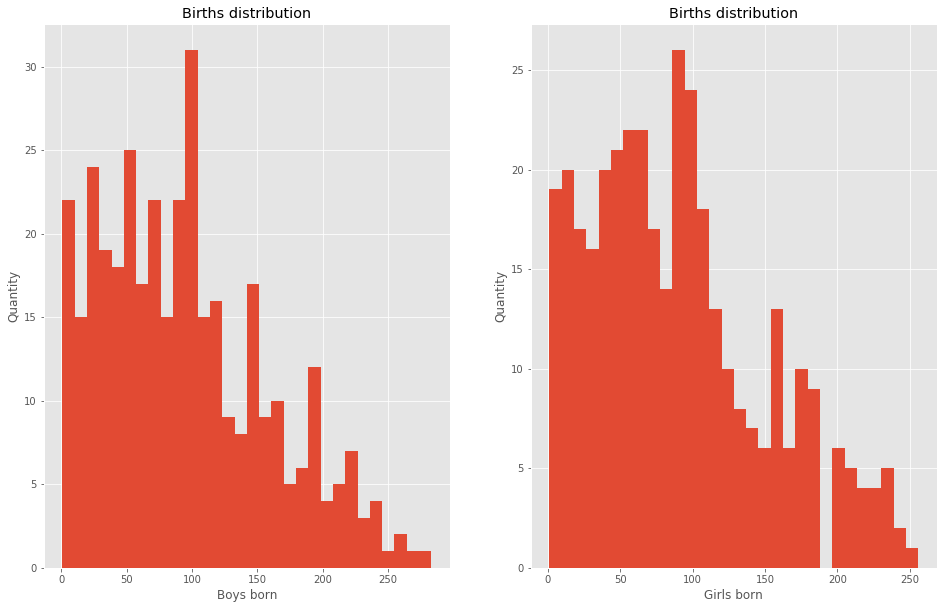

In [8]:
# subplot for boys born
plt.subplot(1,2,1)
boys_births = births_data.loc[births_data['Gender'] == 'Boys']
plt.hist(boys_births['Number'], bins=30)
plt.title('Births distribution')
plt.xlabel('Boys born')
plt.ylabel('Quantity')

# subplot for girls born
plt.subplot(1,2,2)
girls_births = births_data.loc[births_data['Gender'] == 'Girls']
plt.hist(girls_births['Number'], bins=30)
plt.title('Births distribution')
plt.xlabel('Girls born')
plt.ylabel('Quantity')

It looks like more boys than girls are born in the city of barcelona for the years 2013-2017. However, to go more in depth, the number of boys and girls born in each district is plot in a bar plot to compare more easily between the two genders.

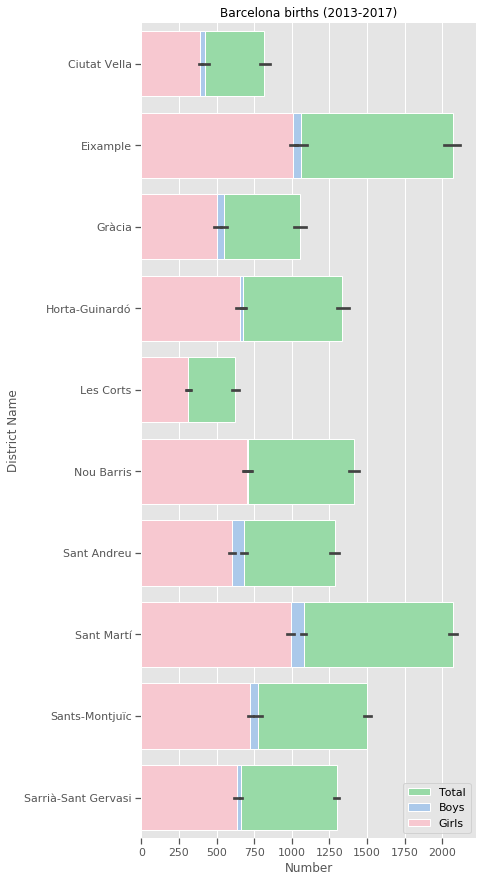

In [9]:
import seaborn as sns
 
sns.set_context('notebook')

district_birhts_per_gender = pd.DataFrame(births_data.groupby(["Year", "District Name", "Gender"])["Number"].sum())
district_birhts_per_gender = district_birhts_per_gender.reset_index()
district_birhts_total = pd.DataFrame(births_data.groupby(["Year", "District Name"])["Number"].sum())
district_birhts_total = district_birhts_total.reset_index()

#print(district_birhts_per_gender.loc[district_birhts_per_gender['Gender']=='Boys']['Number'])
f, ax = plt.subplots(figsize = (6,15))
sns.set_color_codes('pastel')
sns.barplot(x = 'Number', y = 'District Name', data = district_birhts_total,
            label = 'Total', color = 'g', edgecolor = 'w')
sns.barplot(x = district_birhts_per_gender[district_birhts_per_gender['Gender']=='Boys']['Number'], y = 'District Name', 
            data = district_birhts_per_gender, label = 'Boys', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = district_birhts_per_gender[district_birhts_per_gender['Gender']=='Girls']['Number'], y = 'District Name', 
            data = district_birhts_per_gender, label = 'Girls', color = 'pink', edgecolor = 'w').set_title('Barcelona births (2013-2017)')
sns.set_color_codes('muted')


ax.legend(loc = 'lower right')
sns.despine(left = True, bottom = True)
plt.show()

Then, it is confirmed that for most of the districts, the number of boys born is higher than the number of girls. Now, the births dataset is group by year, district and neighborhood in order to get ready to be merged with the deaths and population datasets.

In [10]:
neighborhood_birhts = pd.DataFrame(births_data.groupby(["Year", "District Name", "Neighborhood Name"])["Number"].sum())
neighborhood_birhts.rename(columns={'Number': 'Births'}, inplace=True)
neighborhood_birhts = neighborhood_birhts.reset_index()
neighborhood_birhts = neighborhood_birhts.loc[neighborhood_birhts['Year'] >= 2015]
neighborhood_birhts.columns = ['Year', 'District', 'Neighborhood', 'Births']
neighborhood_birhts

,Year,District,Neighborhood,Births
146,2015,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",166
147,2015,Ciutat Vella,el Barri Gòtic,100
148,2015,Ciutat Vella,el Raval,431
149,2015,Ciutat Vella,la Barceloneta,99
150,2015,Eixample,Sant Antoni,333
...,...,...,...,...
360,2017,Sarrià-Sant Gervasi,Sant Gervasi - la Bonanova,199
361,2017,Sarrià-Sant Gervasi,Sarrià,232
362,2017,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",37
363,2017,Sarrià-Sant Gervasi,el Putxet i el Farró,265


Now, the deaths dataset is going to be analyzed to clean it and get it ready to merge with the birth dataset. Firtly, the not provided data is remove.

In [11]:
# analysis of the deaths dataset in barcelona
deaths_data = deaths_data[deaths_data["District.Name"] != 'No consta']
deaths_data

,Year,District.Code,District.Name,Neighborhood.Code,Neighborhood.Name,Age,Number
0,2017,1,Ciutat Vella,1,el Raval,0-4,1
1,2017,1,Ciutat Vella,2,el Barri Gòtic,0-4,1
2,2017,1,Ciutat Vella,3,la Barceloneta,0-4,0
3,2017,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",0-4,0
4,2017,2,Eixample,5,el Fort Pienc,0-4,0
...,...,...,...,...,...,...,...
4594,2015,10,Sant Martí,69,Diagonal Mar i el Front Marítim del Poblenou,>=100,1
4595,2015,10,Sant Martí,70,el Besòs i el Maresme,>=100,3
4596,2015,10,Sant Martí,71,Provençals del Poblenou,>=100,2
4597,2015,10,Sant Martí,72,Sant Martí de Provençals,>=100,1


This dataset is really similar to the previous one but it is classified by age rather than gender. However, as the age it is not in the scope of the analysis no classification has been made for the differrent age ranges.

In [12]:
district_data_deaths = pd.DataFrame(deaths_data.groupby(["Year", "District.Name", "Neighborhood.Name"])["Number"].sum())
district_data_deaths = district_data_deaths.reset_index()
district_data_deaths.columns = ['Year', 'District', 'Neighborhood', 'Deaths']
district_data_deaths

,Year,District,Neighborhood,Deaths
0,2015,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",169
1,2015,Ciutat Vella,el Barri Gòtic,142
2,2015,Ciutat Vella,el Raval,331
3,2015,Ciutat Vella,la Barceloneta,188
4,2015,Eixample,Sant Antoni,361
...,...,...,...,...
214,2017,Sarrià-Sant Gervasi,Sant Gervasi - la Bonanova,253
215,2017,Sarrià-Sant Gervasi,Sarrià,247
216,2017,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",47
217,2017,Sarrià-Sant Gervasi,el Putxet i el Farró,238


Once the two datasets for the births and deaths are ready to merge, they are brought together into one in order to make things easier for the later visualizations. Additionally, an extra column is generated 'Positive_rate' indicating if the birth rate is greater than the death rate (=1) for that neighborhood or the opposite (=0).

In [13]:
births_deaths_data = pd.merge(neighborhood_birhts, district_data_deaths, how='inner', on=['Year', 'District', 'Neighborhood'])
births_deaths_data['Positive_rate'] = np.where(births_deaths_data['Births'] >= births_deaths_data['Deaths'], 1, 0)
births_deaths_data

,Year,District,Neighborhood,Births,Deaths,Positive_rate
0,2015,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",166,169,0
1,2015,Ciutat Vella,el Barri Gòtic,100,142,0
2,2015,Ciutat Vella,el Raval,431,331,1
3,2015,Ciutat Vella,la Barceloneta,99,188,0
4,2015,Eixample,Sant Antoni,333,361,0
...,...,...,...,...,...,...
212,2017,Sarrià-Sant Gervasi,Sant Gervasi - la Bonanova,199,253,0
213,2017,Sarrià-Sant Gervasi,Sarrià,232,247,0
214,2017,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",37,47,0
215,2017,Sarrià-Sant Gervasi,el Putxet i el Farró,265,238,1


Now, the population datasets is loaded and processed in order to add the population of each neighborhood from each year to the birth_death_data and then, being able to calculate the birth and death rate for each nieghborhood.

In [14]:
population_data = pd.DataFrame(population_data.groupby(["Year", "District.Name", "Neighborhood.Name"])["Number"].sum())
population_data = population_data.reset_index()
population_data = population_data.loc[146:]
population_data.columns = ['Year', 'District', 'Neighborhood', 'Population']
population_data

,Year,District,Neighborhood,Population
146,2015,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",22457
147,2015,Ciutat Vella,el Barri Gòtic,15484
148,2015,Ciutat Vella,el Raval,47142
149,2015,Ciutat Vella,la Barceloneta,15032
150,2015,Eixample,Sant Antoni,38033
...,...,...,...,...
360,2017,Sarrià-Sant Gervasi,Sant Gervasi - la Bonanova,25774
361,2017,Sarrià-Sant Gervasi,Sarrià,25032
362,2017,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",4670
363,2017,Sarrià-Sant Gervasi,el Putxet i el Farró,29470


The last step consist in adding the population in the birth_death_data and calculate the birth and death rate for each of the neighborhoods. Then, the dataset is ready to make a suitable visualization. [4]

In [15]:
births_deaths_rate = pd.merge(births_deaths_data, population_data, how='inner', on=['Year', 'District', 'Neighborhood'])
births_deaths_rate['Population'] = births_deaths_rate['Population'] / 1000 #per 1000 people
births_deaths_rate['Births_rate'] = births_deaths_rate['Births'] / births_deaths_rate['Population']
births_deaths_rate['Deaths_rate'] = births_deaths_rate['Deaths'] / births_deaths_rate['Population']
births_deaths_rate

,Year,District,Neighborhood,Births,Deaths,Positive_rate,Population,Births_rate,Deaths_rate
0,2015,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",166,169,0,22.457,7.391905,7.525493
1,2015,Ciutat Vella,el Barri Gòtic,100,142,0,15.484,6.458280,9.170757
2,2015,Ciutat Vella,el Raval,431,331,1,47.142,9.142590,7.021340
3,2015,Ciutat Vella,la Barceloneta,99,188,0,15.032,6.585950,12.506652
4,2015,Eixample,Sant Antoni,333,361,0,38.033,8.755554,9.491757
...,...,...,...,...,...,...,...,...,...
212,2017,Sarrià-Sant Gervasi,Sant Gervasi - la Bonanova,199,253,0,25.774,7.720959,9.816094
213,2017,Sarrià-Sant Gervasi,Sarrià,232,247,0,25.032,9.268137,9.867370
214,2017,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",37,47,0,4.670,7.922912,10.064240
215,2017,Sarrià-Sant Gervasi,el Putxet i el Farró,265,238,1,29.470,8.992195,8.076010


### Internal migration

For the data analysis in the internal migration data, the first step is to identify the attributes that are going to be useful for the analysis and remove those that are not necessary.

In [16]:
migration_10

,Any,Codi_Districte_baixa,Nom_Districte_baixa,Codi_Barri_baixa,Nom_Barri_baixa,Codi_Districte_alta,Nom_Districte_alta,Codi_Barri_alta,Nom_Barri_alta,Nombre
0,2010,1,Ciutat Vella,1,el Raval,1,Ciutat Vella,1,el Raval,4340
1,2010,1,Ciutat Vella,2,el Barri Gòtic,1,Ciutat Vella,1,el Raval,349
2,2010,1,Ciutat Vella,3,la Barceloneta,1,Ciutat Vella,1,el Raval,91
3,2010,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",1,Ciutat Vella,1,el Raval,208
4,2010,2,Eixample,5,el Fort Pienc,1,Ciutat Vella,1,el Raval,113
...,...,...,...,...,...,...,...,...,...,...
5471,2010,10,Sant Martí,70,el Besòs i el Maresme,99,No consta,99,No consta,0
5472,2010,10,Sant Martí,71,Provençals del Poblenou,99,No consta,99,No consta,0
5473,2010,10,Sant Martí,72,Sant Martí de Provençals,99,No consta,99,No consta,0
5474,2010,10,Sant Martí,73,la Verneda i la Pau,99,No consta,99,No consta,0


The extra columns are drop from each dataset and the indexes with district data not provided or with zero value in the number of people column are remove from the dataset. Next, the dataset is group by 'year', 'city to', 'city from' and 'neighborhood from'.

In [17]:
data_sets = [migration_10, migration_11, migration_12, migration_13, migration_14]

appended_data = []

for data in data_sets:
    # drop extra columns
    data = data.drop(columns=['Codi_Districte_baixa', 'Codi_Barri_baixa', 'Codi_Districte_alta', 'Codi_Barri_alta'])
    data.columns = ['Year', 'From', 'Neighborhood_from', 'To', 'Neighborhood_to', 'Number']
    
    # clean rows such us the ones not provided, zero internal immigrants and the internal migration between the same district 
    indexes = []
    flat_list = []

    remove_index = data[data.From == data.To].index
    indexes.append(remove_index)
    remove_index1 = data[data.From == 'No consta'].index
    indexes.append(remove_index1)
    remove_index2 = data[data.To == 'No consta'].index
    indexes.append(remove_index2)
    remove_index3 = data[data['Number']==0].index
    indexes.append(remove_index3)

    for sublist in indexes:
        for item in sublist:
            flat_list.append(item)

    data = data.drop(index=flat_list)
    
    # get the total amount from each district
    data = pd.DataFrame(data.groupby(["Year", "To", "From", "Neighborhood_from"])["Number"].sum())
    data = data.reset_index()
    appended_data.append(data)

Once the five datasets from each year are appended into one and all the unwanted values are removed, the districts which get higher migration from the different neighborhoods in Barcelona are Eixample, Sants-Montjuïc and Ciutat Vella.

In [18]:
# get data sets with the five years
appended_data = pd.concat(appended_data)
high_migration_districs = appended_data[appended_data['Number'] > 800]
print(high_migration_districs.To.unique())

appended_data['Destination'] = 'People to '
df = appended_data['To'].copy()
appended_data['Destination'] = appended_data["Destination"].str.cat(df)
appended_data

['Eixample' 'Sants-Montjuïc' 'Ciutat Vella']


,Year,To,From,Neighborhood_from,Number,Destination
0,2010,Ciutat Vella,Eixample,Sant Antoni,436,People to Ciutat Vella
1,2010,Ciutat Vella,Eixample,el Fort Pienc,230,People to Ciutat Vella
2,2010,Ciutat Vella,Eixample,l'Antiga Esquerra de l'Eixample,263,People to Ciutat Vella
3,2010,Ciutat Vella,Eixample,la Dreta de l'Eixample,240,People to Ciutat Vella
4,2010,Ciutat Vella,Eixample,la Nova Esquerra de l'Eixample,251,People to Ciutat Vella
...,...,...,...,...,...,...
642,2014,Sarrià-Sant Gervasi,Sants-Montjuïc,Sants - Badal,23,People to Sarrià-Sant Gervasi
643,2014,Sarrià-Sant Gervasi,Sants-Montjuïc,el Poble Sec,55,People to Sarrià-Sant Gervasi
644,2014,Sarrià-Sant Gervasi,Sants-Montjuïc,la Bordeta,13,People to Sarrià-Sant Gervasi
645,2014,Sarrià-Sant Gervasi,Sants-Montjuïc,la Font de la Guatlla,16,People to Sarrià-Sant Gervasi


## 4. Genre

In the present section it has been decided to use two different genre in order to tell the story of Barcelona City (demographics).

The first genre used is an interactive annotated chart with different tabs which displays a scatter plot comparing the death rate and the birth rate for each year. Each dot indicates a neighborhood inside a District and it has annotations for the district name, neighborhood name, births and deaths. The annotated chart genre has been used as it is a great way to display informative data, helping the user to identify in an easier way if a neighborhood is growing or declining in ppopulation. Furthermore, the interactivity allows the user to manipulate the visualization, engaging the reader to the story even more. The selected tools for the visual narrative and narrative structure are described in the following:

- Visual narrative:
    - Visual structuring:Progress Bar/ Timebar
    - Highlighting: Feature Distinction
    - Transition guidance: Familiar Objects
- Narrative structures:
    - Ordering: User directed path
    - Interactivity: Hover Highlighting / Details, Filtering / Selection / Search and Navigation Buttons
    - Messaging: Captions / Headlines and Annotations

The second genre used is an interactive flow chart which displays the internal migration flow between districts for each year and for each district. The chart flow indicates the movement of people from each neightborhood to the selected district by displaying some annotations about the name of the neighborhood the people come from and the number of people. Flow chart is a really nice way of showing migration flows within a city and that the main reason this genre has been selected. In addition, the interactivity give the user the option to select district destinatary and the year, increasing the readers attention to the story.

- Visual narrative:
    - Visual structuring:Progress Bar/ Timebar
    - Highlighting: Feature Distinction and Character Direction
    - Transition guidance: Object Continuity
- Narrative structures:
    - Ordering: User directed path
    - Interactivity: Hover Highlighting / Details, Filtering / Selection / Search and Navigation Buttons
    - Messaging: Captions / Headlines and Annotations

## 5. Visualizations

First, import the libraries from Bokeh than are going to be use. [2]

In [19]:
# Bokeh Libraries
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, Legend
from bokeh.io import output_notebook, reset_output, output_file, save
from bokeh.models.widgets import Tabs, Panel
reset_output()
output_notebook()

Loading BokehJS ...

### Births and deaths rate

As we want to create an interactive plot with different panels for each year and at the same being able to difference between neighborhoods with greater birth rate than death rate, the following split of the data is carry out.

In [20]:
# Store the data from each year in ColumnDataSource
df1 = births_deaths_rate[births_deaths_rate['Year'] == 2015]
births_distric1 = ColumnDataSource(df1[df1['Positive_rate'] == 1])
births_distric2 = ColumnDataSource(df1[df1['Positive_rate'] == 0])

df2 = births_deaths_rate[births_deaths_rate['Year'] == 2016]
births_distric3 = ColumnDataSource(df2[df2['Positive_rate'] == 1])
births_distric4 = ColumnDataSource(df2[df2['Positive_rate'] == 0])

df3 = births_deaths_rate[births_deaths_rate['Year'] == 2017]
births_distric5 = ColumnDataSource(df3[df3['Positive_rate'] == 1])
births_distric6 = ColumnDataSource(df3[df3['Positive_rate'] == 0])

Once all the data is store correctly, a figure for each of the panels has to be created.

In [21]:
# Specify the selection tools to be made available
select_tools = ['box_select', 'lasso_select', 'poly_select', 'tap', 'reset']

# Create the figures for each year
fig1 = figure(plot_height=400,
             plot_width=800,
             x_axis_label='Death per 1,000',
             y_axis_label='Births per 1,000',
             title='Births rate vs Deaths rate - 2015',
             toolbar_location='below',
             tools=select_tools)

fig2 = figure(plot_height=400,
             plot_width=800,
             x_axis_label='Death per 1,000',
             y_axis_label='Births per 1,000',
             title='Births rate vs Deaths rate - 2016',
             toolbar_location='below',
             tools=select_tools)

fig3 = figure(plot_height=400,
             plot_width=800,
             x_axis_label='Death per 1,000',
             y_axis_label='Births per 1,000',
             title='Births rate vs Deaths rate - 2017',
             toolbar_location='below',
             tools=select_tools)

Now, the data is plotted into the figure for each panel and with the two labels established to have a clearer visualization of the neighborhoods with more deaths than births.

In [22]:
# create the figures for each label and for each year
fig1.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric1, size=5,
           legend_label='Birth rate > Death rate',
           color='royalblue',
           selection_color='deepskyblue',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)
fig1.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric2, size=5,
           legend_label='Birth rate < Death rate',
           color='firebrick',
           selection_color='red',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)

fig2.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric3, size=5,
           legend_label='Birth rate > Death rate',
           color='royalblue',
           selection_color='deepskyblue',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)
fig2.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric4, size=5,
           legend_label='Birth rate < Death rate',
           color='firebrick',
           selection_color='red',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)

fig3.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric5, size=5,
           legend_label='Birth rate > Death rate',
           color='royalblue',
           selection_color='deepskyblue',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)
fig3.circle(x='Deaths_rate',
           y='Births_rate',
           source=births_distric6, size=5,
           legend_label='Birth rate < Death rate',
           color='firebrick',
           selection_color='red',
           nonselection_color='lightgray',
           nonselection_alpha=0.3)

GlyphRenderer(id='1193', ...)

Next, the selection tools for the interactive scatter plot are defined as well as the three panels created for each of the years analyzed. [1]

In [23]:
output_file('birth_death_rate.html')

# Format the tooltip
tooltips = [
            ('District','@District'),
            ('Neightborhood', '@Neighborhood'),
            ('Births', '@Births'),
            ('Deaths','@Deaths'),
           ]

# Add the HoverTool to the figure
fig1.add_tools(HoverTool(tooltips=tooltips))
fig2.add_tools(HoverTool(tooltips=tooltips))
fig3.add_tools(HoverTool(tooltips=tooltips))

# Create two panels, one for each conference
year_15 = Panel(child=fig1, title='2015')
year_16 = Panel(child=fig2, title='2016')
year_17 = Panel(child=fig3, title='2017')

# Assign the panels to Tabs
tabs = Tabs(tabs=[year_15, year_16, year_17])

# Show the tabbed layout
show(tabs)

The interactive visualization above is an informative scatter plot which displays the birth and death rate per 1000 people in that neighborhood. By clicking in each of the dots the user can get the information from the district, neighborhood, number of birth and death within that neighborhood. Furthermore, the label help to identify the neighborhoods with higher birth rate than death rate (more birth than deaths) and then the plot is suitable for hour story as in the demographic section we pretend to carry out an anylisis for each of the neighborhoods.

Additionally, another interactive scatter plot which shows the births vs. deaths for the three years is provided and it also differenciates between the ten districs from Barcelona City.

In [24]:
from bokeh.palettes import Spectral6, Category20

# Create the figures for each year
fig = figure(plot_height=400,
             plot_width=800,
             x_axis_label='Births',
             y_axis_label='Deaths',
             title='Births vs Deaths (2015-2017)',
             toolbar_location='below',
             tools=select_tools)

square = dict() # to store vbars
items = list()
color_map = Category20[len(births_deaths_data.District.unique())]

In [25]:
for indx, i in enumerate(births_deaths_data.District.unique()):
    # Store the data from each year in ColumnDataSource
    births_distric1 = ColumnDataSource(births_deaths_data[births_deaths_data['District'] == i])
    
    square[i] = fig.square(x='Births',
                           y='Deaths',
                           source=births_distric1, size=5,
                           fill_alpha = 0.5,
                           muted_alpha = 0.2,
                           muted_color=color_map[indx],
                           fill_color=color_map[indx],
                           line_color = 'grey',
                           selection_color=color_map[indx],
                           nonselection_color='lightgray',
                           nonselection_alpha=0.3)
    items.append((i, [square[i]]))

legend = Legend(items = items, location = (0, -30))
fig.add_layout(legend, 'left') # add legend outside plot
fig.legend.click_policy = "mute" # assigns the click policy

# Format the tooltip
tooltips = [
            ('District', '@District'),
            ('Neighborhood', '@Neighborhood'),
            ('Births', '@Births'),
            ('Deaths', '@Deaths')
            ]

# Add the HoverTool to the figure
fig.add_tools(HoverTool(tooltips=tooltips))

show(fig) # display plot

The above interactive scatter plot is less informative and more difficult of visualizing than the previous one but it has been display to have another visualization which has the districts from the city as labels. However, it is not use in the website as it is believed that the first one is more easy to visualize and it could engage the user into the story.

### Internal migration

For the internal migration, it has been decided to plot different Sankey diagrams for each year and for each district. The purpose of these diagrams is to show the flow of the internal migration from the different districts to each of them and then be able to detect the districts which get more migration as well as the different neighborhoods these people come from.

Import the libraries from holoviews for the internal migration Sankey diagram visualizations. [3]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
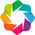

:HoloMap   [Year,Destination]
   :Sankey   [From,To]   (Number,Neighborhood_from)

In [26]:
import holoviews as hv
from holoviews import opts, dim

hv.extension('bokeh')
renderer = hv.renderer('bokeh')

hv_ds = hv.Dataset(
    data=appended_data, 
    kdims=['From', 'To', 'Year', 'Destination'], 
    vdims=['Number', 'Neighborhood_from'],
)

hv_ds = hv_ds.to(hv.Sankey)

hv_ds.opts(width=650, height=500, label_position='left', edge_color='From', node_color='index', cmap='tab20')

In [27]:
# Using renderer save
renderer.save(hv_ds, 'intenal_migration.html')

These Sankey diagrams are suitable for the story as they show the internal migration flow to the different districts and specifying the neighborhood and number of people from that neighborhood that migrate to that district. The reason to pick this interactive plot is because it is so easy to visualize and at the same time is fun to interact with, keeping the users attention high.

## 6. Discusion

This Jupyter Notebook has the purppose of providing the user with informative visualizations from demographic data from Barcelona city and provide them with some insights. The first part focus in the population from differents neighborhoods in Barcelona and it calculates the birth and death rate from each of them. The output visualizations allow the reader to undertand the growth or decline in the population of each neightborhood in a simple and easy way. This plot shows clearly how most of the neightborhoods present a negative growth rate in the studied period, meaning that there are more deaths than births. However, the visualization also idetifies some specific neightborhoods which are growing along the three years like 'Diagonal Mar i el Front Marítim del Poblenou', 'la Vila Olímpica del Poblenou' or 'la Trinitat Vella'.

The second part allow the user to understand the internal migration flow from each neighborhood to each of the district, showing to which districts people is more likely to move and which ones have the greater migration for each year studied. On the one hand, the district which recieves more people per year is Eixample, with around 9,500 people, and follow by San Martí and Sants-Montjuïc, with around 7,000 people for 2010 and deacreasing over the years. The district which gets less people every year is Les Corts, which also decreases along the five-year period.

On the other hand, the visualization also shows in which districs people is more likeky to move and to which district they will rather move. It is clear that neightborhoods like Eixample have high migration to almost all the districts as it is a big neighborhood inside Barcelona. However, it is intereting to play with the visualization and find not so clear migration insights which could help to undertand the user internal relations between neightborhoods.

## 7.Contributions

The current Jupyter Notebook has been done Jorge Bertomeu Genis - s192365.

## References

[1] D'Angio L, "Interactive Data Visualization in Python With Bokeh". (https://realpython.com/python-data-visualization-bokeh/)

[2] Bukeh User Guide and Reference. (https://docs.bokeh.org/en/latest/docs/user_guide/annotations.html)

[3] Holoviews reference gallery. (http://holoviews.org/reference/containers/bokeh/HoloMap.html)

[4] Our World in Data. (https://ourworldindata.org/grapher/birth-rate-vs-death-rate?time=latest)